In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon 
import matplotlib.mlab as mlab
import scipy.stats
import seaborn as sns
sns.set()

%matplotlib inline

# Laden des Datensatzes "breastcancer" aus Kaggle

In [42]:
df = pd.read_csv("C:/Users/Alfa/Documents/breastcancer.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '')


#df.diagnosis.replace(to_replace=dict(M=1, B=0),inplace=True)

df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst,unnamed:_32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [43]:
del df['unnamed:_32']
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


Datensatz reduzieren für die Normalisierung der Daten, damit man nicht mit physikalischen Größen arbeitet.

In [44]:
new_df = df.iloc[:,2:]
new_df

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,17.990,10.38,122.80,1001.0,0.11840,0.27760,0.300100,0.147100,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.71190,0.26540,0.4601,0.11890
1,20.570,17.77,132.90,1326.0,0.08474,0.07864,0.086900,0.070170,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.24160,0.18600,0.2750,0.08902
2,19.690,21.25,130.00,1203.0,0.10960,0.15990,0.197400,0.127900,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.45040,0.24300,0.3613,0.08758
3,11.420,20.38,77.58,386.1,0.14250,0.28390,0.241400,0.105200,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.68690,0.25750,0.6638,0.17300
4,20.290,14.34,135.10,1297.0,0.10030,0.13280,0.198000,0.104300,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.40000,0.16250,0.2364,0.07678
5,12.450,15.70,82.57,477.1,0.12780,0.17000,0.157800,0.080890,0.2087,0.07613,...,15.470,23.75,103.40,741.6,0.17910,0.52490,0.53550,0.17410,0.3985,0.12440
6,18.250,19.98,119.60,1040.0,0.09463,0.10900,0.112700,0.074000,0.1794,0.05742,...,22.880,27.66,153.20,1606.0,0.14420,0.25760,0.37840,0.19320,0.3063,0.08368
7,13.710,20.83,90.20,577.9,0.11890,0.16450,0.093660,0.059850,0.2196,0.07451,...,17.060,28.14,110.60,897.0,0.16540,0.36820,0.26780,0.15560,0.3196,0.11510
8,13.000,21.82,87.50,519.8,0.12730,0.19320,0.185900,0.093530,0.2350,0.07389,...,15.490,30.73,106.20,739.3,0.17030,0.54010,0.53900,0.20600,0.4378,0.10720
9,12.460,24.04,83.97,475.9,0.11860,0.23960,0.227300,0.085430,0.2030,0.08243,...,15.090,40.68,97.65,711.4,0.18530,1.05800,1.10500,0.22100,0.4366,0.20750


# Normalisierung der Daten
(X(w) - Mittelwert(X(w))))/Standardabweichung(X(w)) 

In [45]:
normalized_df=(df.iloc[:,2:]-df.iloc[:,2:].mean())/df.iloc[:,2:].std()

In [46]:
normalized_df.head(10)

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,1.096100,-2.071512,1.268817,0.983510,1.567087,3.280628,2.650542,2.530249,2.215566,2.253764,...,1.885031,-1.358098,2.301575,1.999478,1.306537,2.614365,2.107672,2.294058,2.748204,1.935312
1,1.828212,-0.353322,1.684473,1.907030,-0.826235,-0.486643,-0.023825,0.547662,0.001391,-0.867889,...,1.804340,-0.368879,1.533776,1.888827,-0.375282,-0.430066,-0.146620,1.086129,-0.243675,0.280943
2,1.578499,0.455786,1.565126,1.557513,0.941382,1.052000,1.362280,2.035440,0.938859,-0.397658,...,1.510541,-0.023953,1.346291,1.455004,0.526944,1.081980,0.854222,1.953282,1.151242,0.201214
3,-0.768233,0.253509,-0.592166,-0.763792,3.280667,3.399917,1.914213,1.450431,2.864862,4.906602,...,-0.281217,0.133866,-0.249720,-0.549538,3.391291,3.889975,1.987839,2.173873,6.040726,4.930672
4,1.748758,-1.150804,1.775011,1.824624,0.280125,0.538866,1.369806,1.427237,-0.009552,-0.561956,...,1.297434,-1.465481,1.337363,1.219651,0.220362,-0.313119,0.612640,0.728618,-0.867590,-0.396751
5,-0.475956,-0.834601,-0.386808,-0.505206,2.235455,1.243242,0.865540,0.823931,1.004518,1.888343,...,-0.165353,-0.313560,-0.114908,-0.244105,2.046712,1.720103,1.262133,0.905091,1.752527,2.239831
6,1.169878,0.160508,1.137124,1.094332,-0.123028,0.088218,0.299809,0.646366,-0.064268,-0.761662,...,1.367780,0.322599,1.367122,1.274098,0.518184,0.021196,0.509104,1.195664,0.262245,-0.014718
7,-0.118413,0.358135,-0.072803,-0.218772,1.602639,1.139100,0.060972,0.281702,1.402121,1.658894,...,0.163619,0.400695,0.099361,0.028834,1.446688,0.724148,-0.021035,0.623647,0.477221,1.724917
8,-0.319885,0.588312,-0.183919,-0.383870,2.199903,1.682529,1.218025,1.149680,1.963872,1.571079,...,-0.161215,0.822090,-0.031581,-0.248145,1.661295,1.816711,1.278909,1.390393,2.387756,1.287517
9,-0.473118,1.104467,-0.329192,-0.508616,1.581308,2.561105,1.737343,0.940932,0.796597,2.780649,...,-0.243975,2.440961,-0.286026,-0.297148,2.318256,5.108382,3.991920,1.618591,2.368360,6.840837


In [47]:
df.head(10)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440
6,844359,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368
7,84458202,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.11510
8,844981,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2060,0.4378,0.10720
9,84501001,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2210,0.4366,0.20750


# Test ob Normalisierung stimmt



In [48]:
X=np.mean(df.smoothness_mean)

In [49]:
Y=np.std(df.smoothness_mean)

In [50]:
X

0.096360281195079

In [51]:
Y

0.014051764066591203

In [52]:
Z= (df.smoothness_mean - X)

In [53]:
Z/Y

0      1.568466
1     -0.826962
2      0.942210
3      3.283553
4      0.280372
5      2.237421
6     -0.123136
7      1.604049
8      2.201839
9      1.582699
10    -1.017686
11     0.052642
12     0.073992
13    -0.878913
14     1.191289
15     1.248222
16     0.164372
17     1.468835
18     0.138753
19     0.101747
20     0.792763
21     0.429819
22     0.778530
23    -0.148044
24     1.120124
25     1.582699
26     0.643316
27    -0.139504
28     0.842579
29     0.150139
         ...   
539   -0.688901
540    0.247636
541   -0.568632
542   -0.968582
543   -0.686767
544   -0.041296
545   -0.277565
546   -0.143774
547   -0.540166
548   -0.814864
549   -1.027649
550   -1.569218
551   -0.049836
552   -0.967870
553   -0.281835
554   -1.076753
555   -0.431283
556    0.280372
557   -1.076753
558   -0.827674
559   -0.266890
560    0.208495
561   -1.556408
562    0.600616
563    0.963560
564    1.041842
565    0.102458
566   -0.840484
567    1.525767
568   -3.112085
Name: smoothness_mean, L


jippie es klappt :D

# Hinzufügen der Spalten "id" und "diagnosis"

In [63]:
normalized_df['Id']=df.iloc[:,0]

In [64]:
normalized_df['diagnosis']=df.iloc[:,1]
#normalized_df.diagnosis.replace(to_replace=dict(M=1, B=0),inplace=True)

In [65]:
normalized_df.head(10)


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractal_dimension_mean,...,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst,diagnosis,Id
0,1.096100,-2.071512,1.268817,0.983510,1.567087,3.280628,2.650542,2.530249,2.215566,2.253764,...,2.301575,1.999478,1.306537,2.614365,2.107672,2.294058,2.748204,1.935312,M,842302
1,1.828212,-0.353322,1.684473,1.907030,-0.826235,-0.486643,-0.023825,0.547662,0.001391,-0.867889,...,1.533776,1.888827,-0.375282,-0.430066,-0.146620,1.086129,-0.243675,0.280943,M,842517
2,1.578499,0.455786,1.565126,1.557513,0.941382,1.052000,1.362280,2.035440,0.938859,-0.397658,...,1.346291,1.455004,0.526944,1.081980,0.854222,1.953282,1.151242,0.201214,M,84300903
3,-0.768233,0.253509,-0.592166,-0.763792,3.280667,3.399917,1.914213,1.450431,2.864862,4.906602,...,-0.249720,-0.549538,3.391291,3.889975,1.987839,2.173873,6.040726,4.930672,M,84348301
4,1.748758,-1.150804,1.775011,1.824624,0.280125,0.538866,1.369806,1.427237,-0.009552,-0.561956,...,1.337363,1.219651,0.220362,-0.313119,0.612640,0.728618,-0.867590,-0.396751,M,84358402
5,-0.475956,-0.834601,-0.386808,-0.505206,2.235455,1.243242,0.865540,0.823931,1.004518,1.888343,...,-0.114908,-0.244105,2.046712,1.720103,1.262133,0.905091,1.752527,2.239831,M,843786
6,1.169878,0.160508,1.137124,1.094332,-0.123028,0.088218,0.299809,0.646366,-0.064268,-0.761662,...,1.367122,1.274098,0.518184,0.021196,0.509104,1.195664,0.262245,-0.014718,M,844359
7,-0.118413,0.358135,-0.072803,-0.218772,1.602639,1.139100,0.060972,0.281702,1.402121,1.658894,...,0.099361,0.028834,1.446688,0.724148,-0.021035,0.623647,0.477221,1.724917,M,84458202
8,-0.319885,0.588312,-0.183919,-0.383870,2.199903,1.682529,1.218025,1.149680,1.963872,1.571079,...,-0.031581,-0.248145,1.661295,1.816711,1.278909,1.390393,2.387756,1.287517,M,844981
9,-0.473118,1.104467,-0.329192,-0.508616,1.581308,2.561105,1.737343,0.940932,0.796597,2.780649,...,-0.286026,-0.297148,2.318256,5.108382,3.991920,1.618591,2.368360,6.840837,M,84501001


# Alternative Variante, um nicht die Spalten entfernen und wieder hinzufügen zu müssen

In [66]:
#import numpy as np

#cols = list(df.iloc[:,2:])
#cols.remove('id')
#cols.remove('diagnosis')
#df[cols].head()

#df_normalized = df
#df_normalized.head()

#Now iterate over the remaining columns and create a new z-score column
#for col in cols:
#    col_zscore = col + '_zscore'
#    df_normalized[col] = (df[col] - df[col].mean())/df[col].std(ddof=0)

    
#df_normalized.head()


# Plotten der Ursprünglichen Daten vs. normalized-Data 
!!!Skalal ändert sich!!!

In [67]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


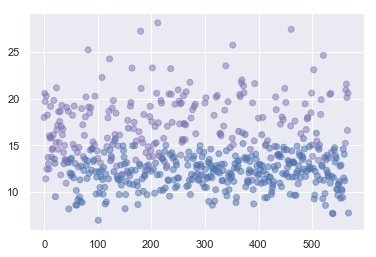

In [68]:
plt.scatter(x=df.index,y=df.radius_mean, color = df.diagnosis, alpha=0.5)
plt.show()

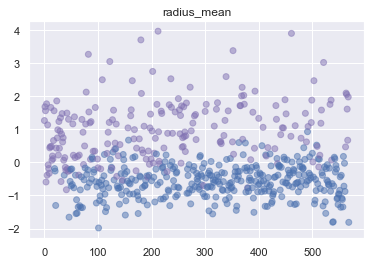

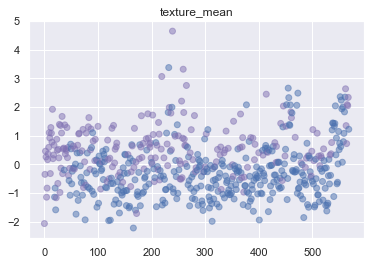

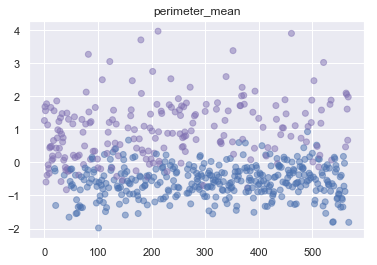

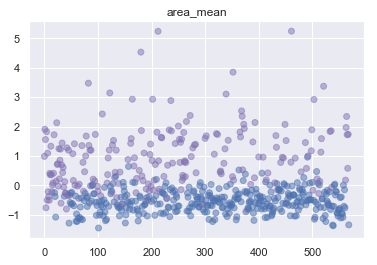

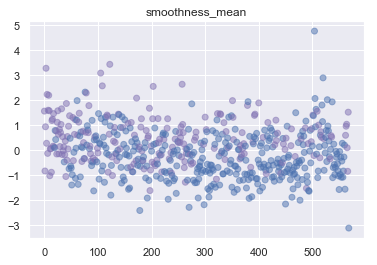

...

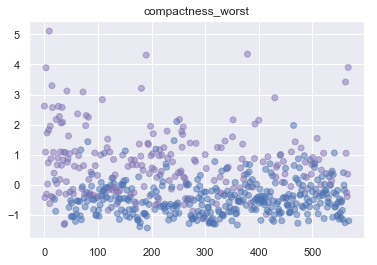

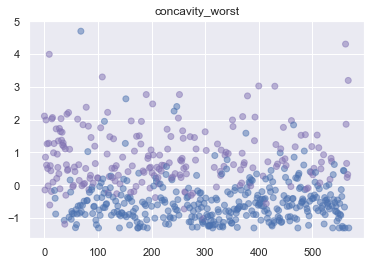

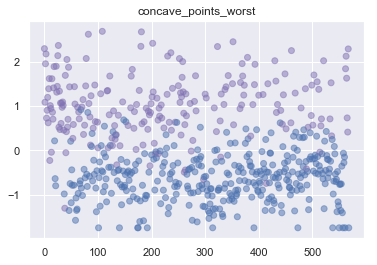

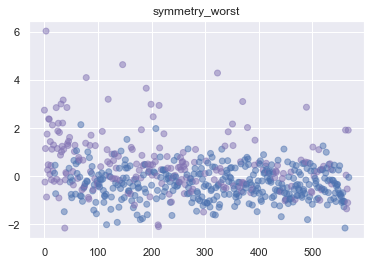

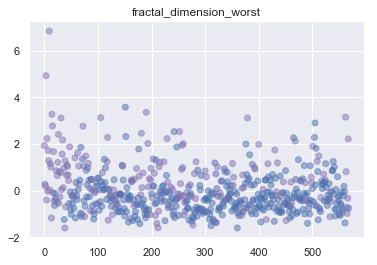

In [69]:
plt.scatter(x=normalized_df.index,y=normalized_df.iloc[:,2], color = normalized_df.diagnosis, alpha=0.5)
plt.title('radius_mean')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.texture_mean, color = normalized_df.diagnosis, alpha=0.5)
plt.title('texture_mean')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.perimeter_mean, color = normalized_df.diagnosis, alpha=0.5)
plt.title('perimeter_mean')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.area_mean, color = normalized_df.diagnosis, alpha=0.5)
plt.title('area_mean')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.smoothness_mean, color = normalized_df.diagnosis, alpha=0.5)
plt.title('smoothness_mean')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.compactness_mean, color = normalized_df.diagnosis, alpha=0.5)
plt.title('compactness_mean')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.concavity_mean, color = normalized_df.diagnosis, alpha=0.5)
plt.title('concavity_mean')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.concave_points_mean, color = normalized_df.diagnosis, alpha=0.5)
plt.title('concave_points_mean')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.radius_worst, color = normalized_df.diagnosis, alpha=0.5)
plt.title('radius_worst')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.texture_worst, color = normalized_df.diagnosis, alpha=0.5)
plt.title('texture_worst')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.perimeter_worst, color = normalized_df.diagnosis, alpha=0.5)
plt.title('perimeter_worst')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.area_worst, color = normalized_df.diagnosis, alpha=0.5)
plt.title('area_worst')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.smoothness_worst, color = normalized_df.diagnosis, alpha=0.5)
plt.title('smoothness_worst')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.compactness_worst, color = normalized_df.diagnosis, alpha=0.5)
plt.title('compactness_worst')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.concavity_worst, color = normalized_df.diagnosis, alpha=0.5)
plt.title('concavity_worst')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.concave_points_worst, color = normalized_df.diagnosis, alpha=0.5)
plt.title('concave_points_worst')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.symmetry_worst, color = normalized_df.diagnosis, alpha=0.5)
plt.title('symmetry_worst')
plt.show()

plt.scatter(x=normalized_df.index,y=normalized_df.fractal_dimension_worst, color = normalized_df.diagnosis, alpha=0.5)
plt.title('fractal_dimension_worst')
plt.show()

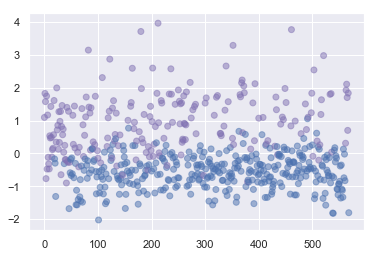

In [70]:
plt.scatter(x=normalized_df.index,y=normalized_df.radius_mean, color = normalized_df.diagnosis, alpha=0.5)
plt.show()

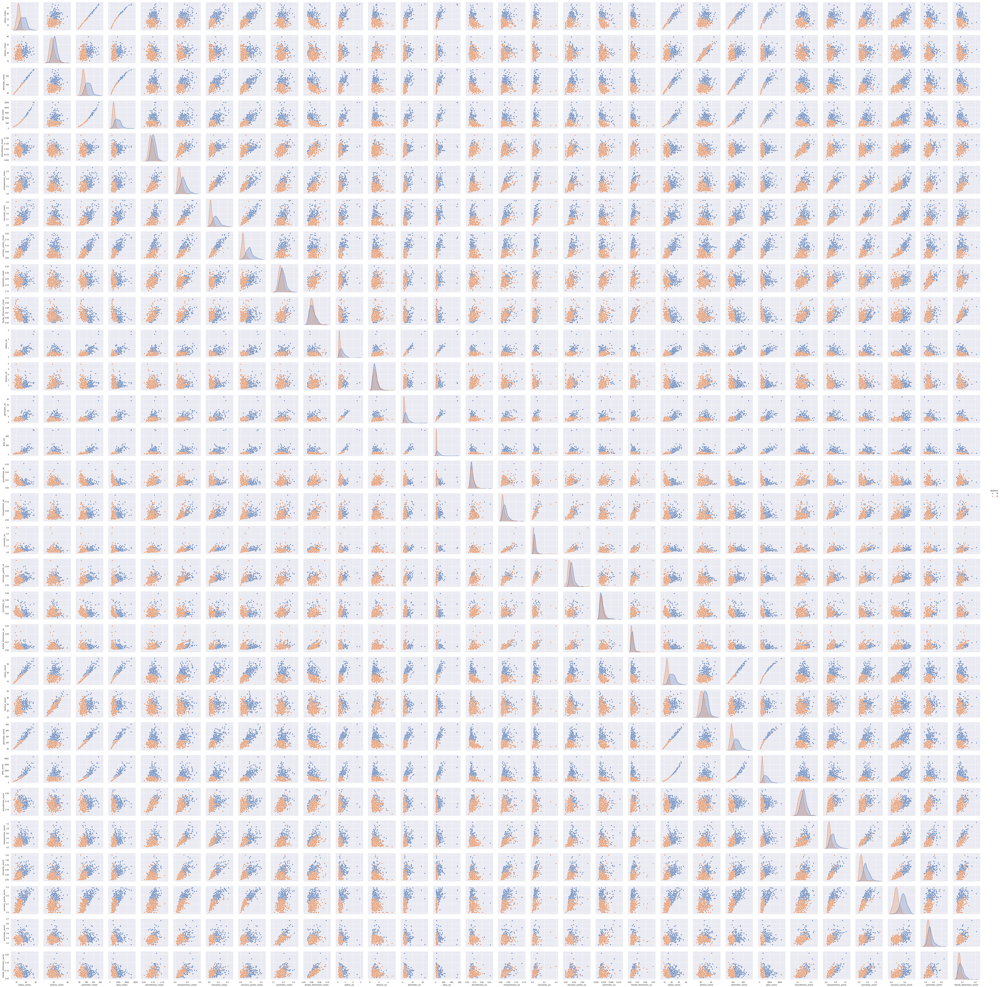

In [71]:
g = sns.pairplot(df.iloc[:,1:32], hue='diagnosis')

## RandomForest


In [91]:
#normalized_df.diagnosis.replace(to_replace=dict(M=1, B=0),inplace=True) # diagnosis in 0 und 1 konvertieren


X = normalized_df.iloc[:, 0:29].values #datensatz für descision-trees
y = normalized_df.iloc[:, 30].values #Zielfunktion diagnosis 


In [92]:
X

array([[ 1.09609953, -2.0715123 ,  1.26881726, ...,  2.10767182,
         2.2940576 ,  2.74820411],
       [ 1.82821197, -0.35332152,  1.68447255, ..., -0.14661996,
         1.08612862, -0.24367526],
       [ 1.5784992 ,  0.45578591,  1.56512598, ...,  0.85422232,
         1.95328166,  1.15124203],
       ...,
       [ 0.70166686,  2.04377549,  0.67208442, ...,  0.32647934,
         0.41370467, -1.10357792],
       [ 1.83672491,  2.33440316,  1.98078127, ...,  3.1947936 ,
         2.28797231,  1.9173959 ],
       [-1.80681144,  1.22071793, -1.81279344, ..., -1.30468267,
        -1.7435287 , -0.04809589]])

In [93]:
y

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1,
       0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,

In [108]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.8, random_state=0)

In [109]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [110]:
from sklearn.ensemble import RandomForestRegressor

regressor = RandomForestRegressor(n_estimators=200, random_state=0)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

In [111]:
y_pred

array([0.97 , 0.   , 0.   , 0.01 , 0.   , 0.   , 0.005, 0.   , 0.   ,
       0.   , 0.625, 0.   , 0.   , 0.245, 0.535, 0.735, 0.125, 0.995,
       0.94 , 1.   , 0.325, 1.   , 0.025, 0.   , 0.855, 0.   , 0.   ,
       0.9  , 0.   , 0.995, 0.   , 0.98 , 0.02 , 0.865, 0.   , 0.915,
       0.   , 0.915, 0.   , 0.99 , 0.075, 0.05 , 0.265, 0.   , 0.09 ,
       0.965, 0.   , 0.   , 0.   , 1.   , 0.935, 0.945, 0.995, 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 1.   , 0.875, 0.995, 0.   ,
       0.005, 0.985, 0.065, 0.985, 1.   , 0.965, 0.   , 0.075, 1.   ,
       0.   , 0.115, 0.965, 0.   , 0.   , 0.505, 0.   , 0.   , 0.465,
       0.975, 1.   , 0.   , 0.845, 0.   , 0.   , 0.   , 0.995, 1.   ,
       0.   , 0.185, 0.07 , 0.985, 0.   , 0.   , 1.   , 0.1  , 0.   ,
       0.   , 0.01 , 0.   , 0.   , 0.   , 1.   , 0.05 , 1.   , 0.105,
       0.15 , 0.92 , 0.   , 1.   , 1.   , 0.405, 0.   , 0.   , 0.225,
       0.   , 0.   , 0.   , 0.06 , 0.   , 0.905, 0.12 , 0.975, 0.29 ,
       0.115, 0.   ,

In [127]:
from sklearn import metrics
#errors = np.abs(y_pred - y_test)
#print(errors)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 0.0943530701754386
Mean Squared Error: 0.0585798793859649
Root Mean Squared Error: 0.242032806425007


In [128]:
mape = 100 * (errors / y_test)

C:\Users\Alfa\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.
C:\Users\Alfa\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


In [129]:
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Accuracy: nan %.
